### Probability estimators

#### Integration

In [1]:
using HCubature
function get_collision_probability_node2(n1,t1,n2,t2,nn,lambda;bound_max=100.0)

    function h(x)
        y = x[1]
        t = x[2]
        density = (1-cdf(Gamma(nn,lambda),abs(t2-t1-y))) * pdf(Gamma(n1,lambda), t) * pdf(Gamma(n2,lambda),t-y)
        return density
    end

    a = [-100.0;0.0]
    b = [0.0,100.0]
    m = [0.0;0.0]
    n = [100.0,100.0]
    
    #bound = max(t1+n1,t2+n2)*lambda + 30.0
    bound = bound_max
    
    o = bound.*[-1.0,-1.0]
    p = bound.*[1.0,1.0]

    C, err = hcubature(h,o,p,maxevals=10^8)

    return C, err
end

get_collision_probability_node2 (generic function with 1 method)

#### Monte Carlo

In [2]:
using Distributions
function count_conflicts(n1,t1,n2,t2,nn,lambda,num_particles)
    EA1 = rand(Gamma(n1,lambda),num_particles)
    EA2 = rand(Gamma(n2,lambda),num_particles)
    ed1 = rand(Gamma(nn,lambda),num_particles)
    ed2 = rand(Gamma(nn,lambda),num_particles)
    
    r1_arrivals = t1 .+ EA1
    r1_departures = r1_arrivals + ed1
    r2_arrivals = t2 .+ EA2
    r2_departures = r2_arrivals + ed2
    
    num_conflicts =length(findall(((r2_departures-r1_arrivals).>0) .& ((r1_departures-r2_arrivals).>0)   ))
    
    return num_conflicts/num_particles
end

count_conflicts (generic function with 1 method)

### Probability evaluation

#### Averaged convergence plot

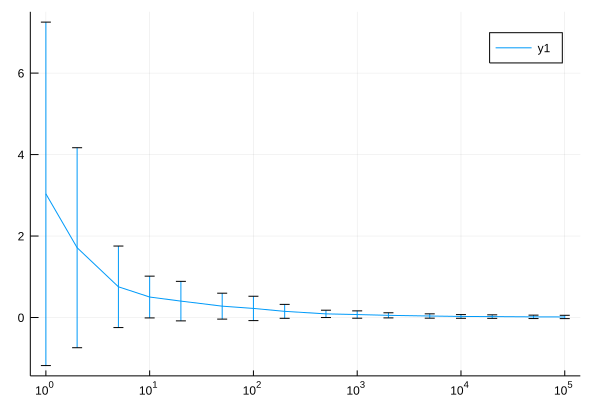

In [4]:
using DataFrames
using Statistics
using Plots
df = DataFrame(num_particles=Int64[],cp=Float64[],experimental_cp=Float64[],etas=Float64[])
x_list = [1,2,5,10,20,50,100,200,500,1000,2000,5000,10000,20000,50000,100000]
max_attempts = 10000

# Defining global variables
n1 = 0
n2 = 0
t1 = 0
t2 = 0
nn = 0
lambda = 0

for k in 1:200

    theoretical_cp = 0.0
    attempts = 0

    while theoretical_cp < 0.01 && attempts < max_attempts
        n1 = rand(1:20)
        t1 = rand()*20
        n2 = rand(1:20)
        t2 = rand()*20
        nn = rand(1:5)
        lambda = rand()
        theoretical_cp = get_collision_probability_node2(n1,t1,n2,t2,nn,lambda)[1]
        attempts += 1

    end
    for x in x_list
        
        experimental_cp = count_conflicts(n1,t1,n2,t2,nn,lambda,x)
        ecart_relatif = abs(experimental_cp-theoretical_cp)/theoretical_cp
        if abs(ecart_relatif) > 0.5 && x > 2000
            println("Exception case occured! Returned something really wrong.")
            println("n1: ", n1, " t1: ", t1, " n2: ", n2, " t2: ", t2, " nn: ", nn, " lambda: ", lambda)
        end
        push!(df,[x,theoretical_cp,experimental_cp,ecart_relatif])
    end
end

ys = []
stds = []
for x in x_list
    indexes = findall((df[1].==x) .& (df[2] .> 0.01) .& (df[2] .< 1.0) .& (df[3] .> 0.01))
    values = df[4][indexes]
    y = mean(values)
    stdv = std(values)
    append!(ys,y)
    append!(stds,stdv)
end

plot(x_list,ys,yerror=stds,xscale = :log10,xlabel="Number of particles per simulation", ylabel="Relative error")

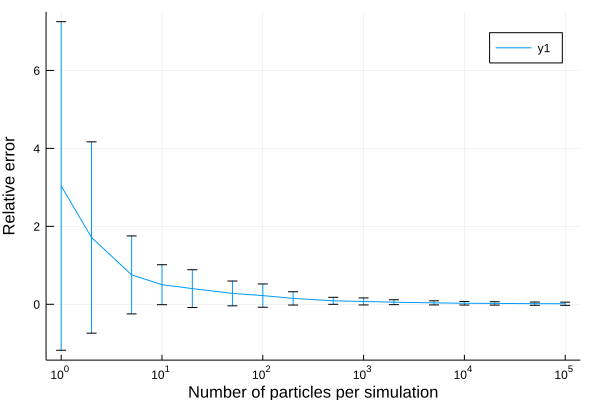

In [5]:
plot(x_list,ys,yerror=stds,xscale = :log10,xlabel="Number of particles per simulation", ylabel="Relative error")

### Time comparisons

In [3]:
using DataFrames
using Statistics
using Plots
df_time = DataFrame(n1=Int64[],t1=Float64[],n2=Int64[],t2=Float64[],nn=Int64[],n_max=Int64[],lambda=Float64[],time_cp=Float64[],time_mc=Float64[],num_mc_particles=Float64[],errorMC_CP=Float64[],p_collision = Float64[],boundvalue = Int64[])
x_list = [100,200,500,1000,2000,5000,10000,20000,50000,100000,200000,500000,1000000,2000000,5000000,10000000]
max_attempts = 10000

desired_precision = 10^(-3)

# Defining global variables
n1 = 0
n2 = 0
t1 = 0
t2 = 0
nn = 0
n_mx = 0
lambda = 0

println("Starting evaluations")

for k in 1:20000
    
    if k%1000 == 0
        println(div(k,200), " %")
    end
    
    bound = 20 + 10*rand(0:24)

    theoretical_cp = 0.0
    theoretical_time = 100000


    n1 = rand(2:100)
    t1 = rand()*20
    n2 = rand(2:100)
    t2 = rand()*20
    nn = rand(1:100)
    n_mx = maximum([n1,n2,nn])
    lambda = rand()
    theoretical_cp_tot = @timed get_collision_probability_node2(n1,t1,n2,t2,nn,lambda;bound_max = bound)
    theoretical_cp = theoretical_cp_tot[1][1]
    theoretical_time = theoretical_cp_tot[2]


    # Make it global
    x = 0
    cp_time = 10000000
    
    x_counter = 2
    cp_old = count_conflicts(n1,t1,n2,t2,nn,lambda,x_list[1])
    cp_new = 10000
    
    while x_counter < 16 && abs(cp_old-cp_new) > desired_precision
        cp_old = cp_new
        
        x = x_list[x_counter]
        
        cp_new_t = @timed count_conflicts(n1,t1,n2,t2,nn,lambda,x)
        cp_new = cp_new_t[1]
        cp_time = cp_new_t[2]
        
        x_counter += 1

    end
    push!(df_time, [n1,t1,n2,t2,nn,n_mx,lambda,theoretical_time,cp_time,x,abs(cp_new-theoretical_cp),cp_new,bound])
    
end

scatter(df_time[6],[df_time[8],df_time[9]],title="Computation time",xlabel="Max(n)",ylabel="t")


Starting evaluations
5 %
10 %
15 %
20 %
25 %
30 %
35 %
40 %
45 %
50 %
55 %
60 %
65 %
70 %
75 %
80 %
85 %
90 %
95 %
100 %


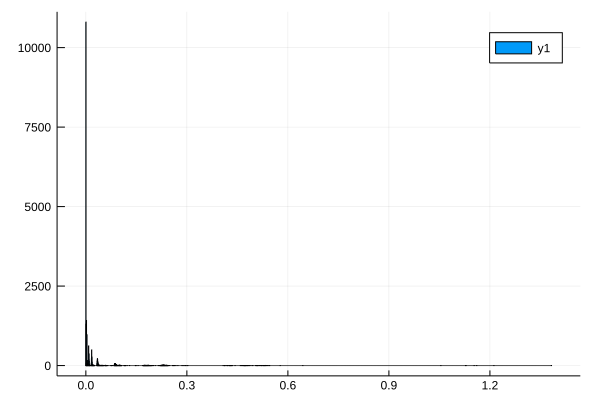

In [5]:
histogram(df_time[9])

In [4]:
df_time

,n1,t1,n2,t2,nn,n_max,lambda,time_cp,time_mc,num_mc_particles,errorMC_CP,p_collision,boundvalue
,Int64,Float64,Int64,Float64,Int64,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Int64
1,4,6.62207,54,9.50157,32,54,0.21282,1.55506,0.000339039,2000.0,5.10188e-5,0.0005,90
2,43,12.4698,22,3.51058,32,43,0.184799,0.0131182,8.4377e-5,500.0,0.000122073,0.0,60
3,87,13.0013,20,7.25908,68,87,0.759319,0.0276953,0.0208552,100000.0,0.000396673,0.3088,200
4,52,2.42369,60,14.2236,40,60,0.446225,0.018832,0.0365558,200000.0,0.000976955,0.67198,220
5,43,19.2599,56,0.834076,7,56,0.809182,0.0123586,0.0102671,50000.0,0.000538297,0.33862,100
6,78,8.25768,95,6.22623,62,95,0.994651,0.018402,0.00166745,10000.0,0.000161336,0.9988,120
7,53,8.74297,65,14.9211,37,65,0.887212,0.0185703,0.00033662,2000.0,0.00475408,0.9225,220
8,51,2.00638,24,14.6047,56,56,0.34012,0.0269861,8.4506e-5,500.0,1.16122e-5,1.0,60
9,25,4.52025,74,7.6695,83,83,0.303711,3.5371e-5,0.00166819,10000.0,0.9606,0.9606,260


In [46]:
xs = (df_time[7]) .* (df_time[1] .- df_time[3]) .+ df_time[2] - df_time[4];

In [58]:
xs_reg = collect([df_time[1][1:2000],df_time[2][1:2000],df_time[3][1:2000],df_time[4][1:2000],df_time[5][1:2000],df_time[7][1:2000]])

6-element Array{Array{Float64,1},1}:
 [4.0, 43.0, 87.0, 52.0, 43.0, 78.0, 53.0, 51.0, 25.0, 66.0  …  35.0, 64.0, 70.0, 9.0, 64.0, 6.0, 27.0, 73.0, 80.0, 6.0]                                                                                  
 [6.62207, 12.4698, 13.0013, 2.42369, 19.2599, 8.25768, 8.74297, 2.00638, 4.52025, 7.80733  …  2.13396, 13.8507, 19.023, 12.1275, 1.76462, 11.3542, 2.46438, 0.6454, 2.50978, 10.0997]                    
 [54.0, 22.0, 20.0, 60.0, 56.0, 95.0, 65.0, 24.0, 74.0, 9.0  …  97.0, 25.0, 21.0, 90.0, 30.0, 92.0, 21.0, 56.0, 16.0, 68.0]                                                                               
 [9.50157, 3.51058, 7.25908, 14.2236, 0.834076, 6.22623, 14.9211, 14.6047, 7.6695, 15.7505  …  7.29035, 10.6295, 2.78664, 16.5484, 1.66905, 12.1006, 5.08541, 9.83547, 6.55501, 17.0623]                  
 [32.0, 32.0, 68.0, 40.0, 7.0, 62.0, 37.0, 56.0, 83.0, 29.0  …  70.0, 4.0, 45.0, 56.0, 10.0, 3.0, 71.0, 88.0, 23.0, 79.0]                              

In [57]:
ys = collect(df_time[8][1:2000])

2000-element Array{Float64,1}:
 1.555061519
 0.013118177
 0.027695322
 0.018831983
 0.012358592
 0.018402035
 0.01857026 
 0.026986111
 3.5371e-5  
 1.3503e-5  
 0.014024085
 0.013824157
 0.020461398
 ⋮          
 0.019097645
 0.032558418
 0.009788137
 0.012058322
 0.018779592
 0.01293885 
 0.011419002
 1.518e-5   
 0.021720554
 0.021922162
 0.015801537
 0.006985659

In [60]:
using GLM
xs = df_time[1,2,3,4,5,7]
ys = df_time[8]
ols = lm(@formula(Y ~ X), data)

  Updating registry at `~/.julia/registries/General`
  Updating git-repo `https://github.com/JuliaRegistries/General.git`
Fetching: [========================================>]  100.0 %.0 %12.4 %>                              ]  24.9 %>                    ]  49.7 % [=========================>               ]  62.1 %74.5 %>     ]  86.9 % [========================================>]  99.3 % Resolving package versions...
 Installed OrderedCollections ─ v1.1.0
 Installed PlotUtils ────────── v0.5.8
 Installed StatsModels ──────── v0.5.0
 Installed GLM ──────────────── v1.1.1
 Installed Documenter ───────── v0.22.3
  Updating `~/.julia/environments/v1.0/Project.toml`
  [38e38edf] + GLM v1.1.1
  Updating `~/.julia/environments/v1.0/Manifest.toml`
  [e30172f5] ↑ Documenter v0.22.2 ⇒ v0.22.3
  [38e38edf] + GLM v1.1.1
  [bac558e1] ↑ OrderedCollections v1.0.2 ⇒ v1.1.0
  [995b91a9] ↑ PlotUtils v0.5.7 ⇒ v0.5.8
  [3eaba693] + StatsModels v0.5.0


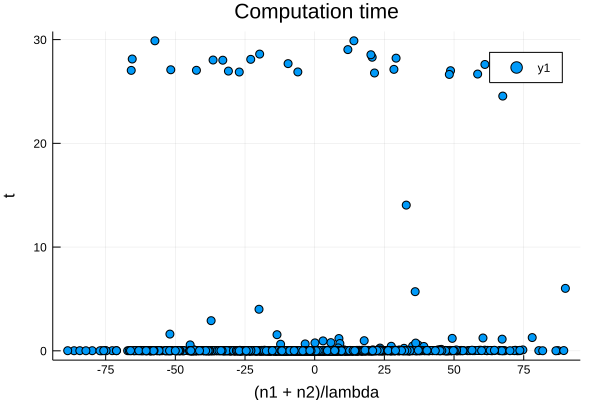

In [43]:
scatter(xs[1:2000],df_time[8][1:2000],title="Computation time",xlabel="(n1 + n2)/lambda",ylabel="t")

#### Probability error as a function of chosen bound value

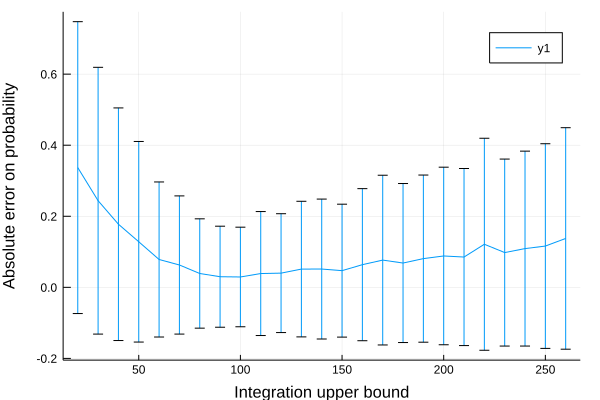

In [19]:
xs = collect(20 .+ 10*(0:24))
ys = []
y_stds = []
for x in xs
    y_idxs = findall(df_time[13].==x)
    meany = mean(df_time[y_idxs,11])
    stdy = std(df_time[y_idxs,11])
    append!(ys,meany)
    append!(y_stds,stdy)
end
plot(xs,ys,yerror = y_stds,xlabel="Integration upper bound", ylabel="Absolute error on probability")


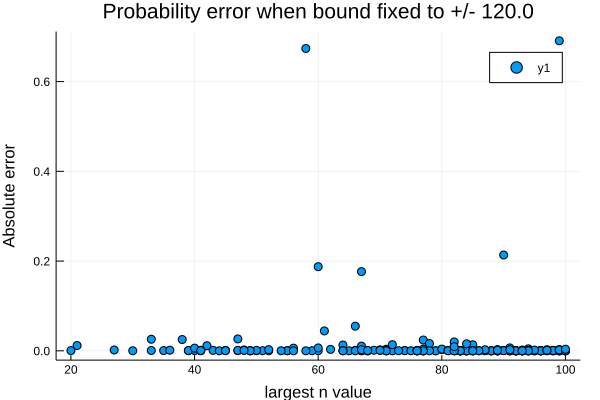

In [73]:
scatter(df_time[6],df_time[11],xlabel="largest n value", ylabel="Absolute error",title="Probability error when bound fixed to +/- 120.0")

In [74]:
length(findall(df_time[11].>0.1))/length(df_time[11])

0.025

In [16]:
ys = findall(df_time[11].>.9)

1117-element Array{Int64,1}:
     9
    15
    18
    31
    33
    39
    50
    73
    83
    90
   117
   121
   123
     ⋮
 19728
 19759
 19760
 19812
 19869
 19880
 19917
 19939
 19982
 19988
 19991
 19996

In [18]:
mean(df_time[ys,5])

71.78782452999104

##### Save data

In [6]:
using CSV
CSV.write("Large_prob_test.csv",df_time)

"Large_prob_test.csv"